In [5]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

%matplotlib inline
%config InlineBackend.figure_format='retina'
%config IPCompleter.greedy=True

In [3]:
import utils.data as data
import utils.encoder as encoder
import utils.models as models
from utils.filename import *
from utils.image import *
from utils.params import *
# from utils.generator import *


Using TensorFlow backend.


In [ ]:
# %load utils/generator.py
from sklearn.model_selection import train_test_split

from utils.filename import *
from utils.image import *
from utils.data import *
from utils.params import *
from utils.preprocess import *

def train_manufacturer_gen():
    while True:
        img_filename = np.random.choice(train_images)        
        car_code, angle_code = filename_to_code(img_filename)
        img = read_image(car_code, angle_code)/255
        img = resize(img)
        label = pd.get_dummies(maker).loc[car_code].values
        yield img.reshape(-1, INPUT_SIZE, INPUT_SIZE, 3), label.reshape(1, -1)
    
def val_manufacturer_gen():
    while True:
        img_filename = np.random.choice(validation_images)        
        car_code, angle_code = filename_to_code(img_filename)
        img = read_image(car_code, angle_code)/255
        img = resize(img)
        label = pd.get_dummies(maker).loc[car_code].values
        yield img.reshape(-1, INPUT_SIZE, INPUT_SIZE, 3), label.reshape(1, -1)

def train_generator():
    while True:
        for start in range(0, len(train_images), BATCH_SIZE):
            x_batch = []
            y_batch = []
            end = min(start + BATCH_SIZE, len(train_images))
#             print("Generating a new batch,...")
            train_batch = train_images[start:end]                 
            for sample in train_batch :
                car_code, angle_code = filename_to_code(sample)
                img = read_image(car_code, angle_code)
                img = resize(img)
                mask = read_image(car_code, angle_code, mask = True)
                mask = resize(mask)
                img = randomHueSaturationVariation(img, hue_shift_limit=(-50,50),
                                                   sat_shift_limit=(-5, 5), val_shift_limit=(-15, 15))
                img, mask = randomShiftScaleRotate(img, mask,  rotate_limit=(-5, 5))
                img, mask = randomHorizontalFlip(img, mask)
                # image, mask = randomCrop(image, mask)

                mask = np.expand_dims(mask, axis = 2)
                
                x_batch.append(img)
                y_batch.append(mask)
                
            x_batch = np.array(x_batch, np.float32) / 255
            y_batch = np.array(y_batch, np.float32) / 255
#             print("Dispatching the genrated batch,...")
            yield x_batch, y_batch
                 
def valid_generator():
    while True:
        for start in range(0, len(validation_images), BATCH_SIZE):
            x_batch = []
            y_batch = []
            end = min(start + BATCH_SIZE, len(validation_images))
            valid_batch = validation_images[start:end]
            for sample in valid_batch:
                car_code, angle_code = filename_to_code(sample)
                img = read_image(car_code, angle_code)
                img = resize(img)
                mask = read_image(car_code, angle_code, mask = True)
                mask = resize(mask)
                mask = np.expand_dims(mask, axis = 2)
                x_batch.append(img)
                y_batch.append(mask)
                
            x_batch = np.array(x_batch, np.float32) / 255
            y_batch = np.array(y_batch, np.float32) / 255
            
            yield x_batch, y_batch


In [ ]:
from keras.callbacks import CSVLogger, ModelCheckpoint, TensorBoard
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras_tqdm import TQDMCallback, TQDMNotebookCallback

In [4]:
from utils.data import *

In [ ]:
train_masks = read_train_masks()

In [ ]:
# Split for cross validation
from sklearn.model_selection import train_test_split
train_images, validation_images = train_test_split(train_masks['img'], train_size = 0.8, random_state = 42)

In [ ]:
def trainModel(model):
    print("Start,..")
    callbacks = [
        ModelCheckpoint(filepath='models/unet_128.best_weights.hdf5',
                       monitor='val_loss', verbose=2, save_best_only=True),
        TensorBoard(log_dir='./logs/unet_128', histogram_freq=1,
                   batch_size=BATCH_SIZE, write_graph=True,
                   write_images=True, write_grads=True),
        EarlyStopping(monitor='val_loss', patience=8, verbose=1, min_delta=1e-4),
        ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=1, epsilon=1e-4),
        TQDMNotebookCallback()        
    ]
    print("Create Callbacks,..")
    
    epoch_steps = int(np.ceil(float(len(train_images)) / float(BATCH_SIZE)))
    val_steps = int(np.ceil(float(len(validation_images)) / float(BATCH_SIZE)))

    print("Start Training,..")

    history = model.fit_generator(generator=train_generator(), steps_per_epoch=epoch_steps,
                                 epochs = 100, validation_steps=val_steps,
                                validation_data=valid_generator(), callbacks=callbacks, verbose=2)
    
    print("Training Complete,...")
    return history

In [5]:
unet_128 = models.get_unet_128()

In [6]:
unet_128.load_weights('models/unet_128.best_weights.hdf5')

In [ ]:
BATCH_SIZE = 8

In [ ]:
unet_128_history = trainModel(unet_128)

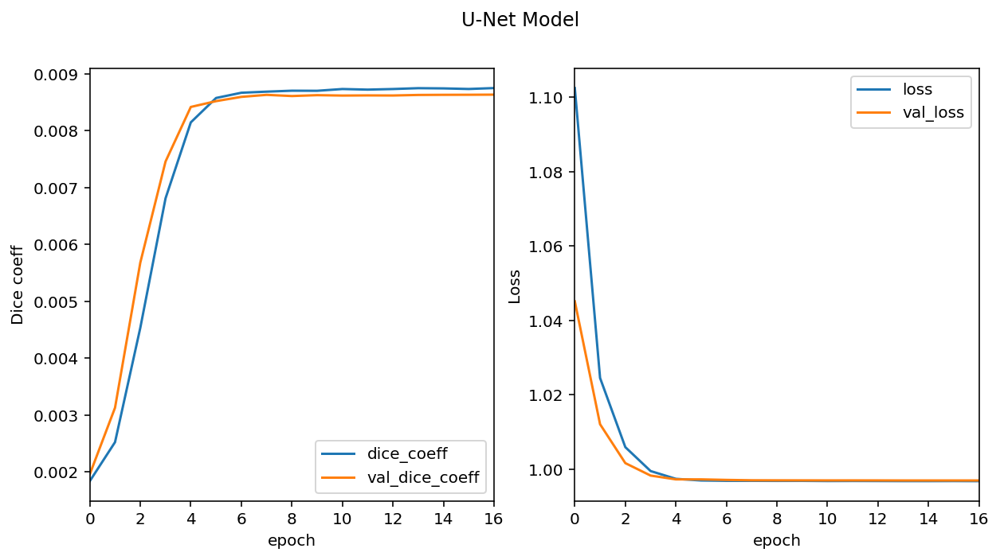

In [8]:
# unet_128_history_DF = pd.DataFrame(unet_128_history.history)
unet_128_history_DF = pd.read_csv('logs/unet_128_history.csv')

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(10, 5))
unet_128_history_DF[['dice_coeff', 'val_dice_coeff']].plot(ax = axes[0]);
# pd.DataFrame(baseline_history.history)[['acc', 'val_acc']].plot()
unet_128_history_DF[['loss', 'val_loss']].plot(ax = axes[1])
fig.suptitle("U-Net Model")
# plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
axes[0].set_xlabel('epoch')
axes[0].set_ylabel('Dice coeff')
axes[1].set_xlabel('epoch')
axes[1].set_ylabel('Loss')

# unet_128_history_DF.to_csv('logs/unet_128_history01.csv')
# unet_128_history_DF.head()

In [7]:
sample_car_code = '00087a6bd4dc'
sample_angle_code = '04'

In [ ]:

sample = read_image(sample_car_code, sample_angle_code)

fig, ax = plt.subplots(1, 3, figsize=(16, 16))
# ax = ax.ravel()

sample = resize(sample)
x_batch = []
x_batch.append(sample)
x_batch = np.array(x_batch, np.float32) /255
sample_pred = unet_128.predict(x_batch).squeeze()

sample.__class__
ax[0].imshow(sample)
ax[1].imshow(sample_pred, cmap='gray')
ax[2].imshow(sample_pred > 0.001, cmap='gray')
# plt.imshow(sample_pred > .5, cmap = 'gray')

In [ ]:
# t = train_generator()

In [ ]:
import utils.vis as visutils
import imp
imp.reload(visutils)

visutils.vis_predictions(unet_128)

In [ ]:
import utils.vis as visutils
import imp
imp.reload(visutils)

visutils.vis_predictions(unet_128, True)

In [9]:
# imp.reload(utils.params)
# imp.reload(utils.data)
# imp.reload(utils.image)
# imp.reload(utils.filename)

import utils.data as data
import utils.encoder as encoder

threshold = 0.001

orig_width = 1918
orig_height = 1280

rles = []
ids_test = data.list_test_files()
print('Predicting on {} samples with batch_size = {}...'.format(len(ids_test), BATCH_SIZE))
for start in tqdm(range(0, len(ids_test), BATCH_SIZE)):
    x_batch = []
    end = min(start + BATCH_SIZE, len(ids_test))
    ids_test_batch = ids_test[start:end]
    for id in ids_test_batch:
        car_code, angle_code = filename_to_code(id)
        img = read_image(car_code, angle_code, test = True)
        img = resize(img)
        x_batch.append(img)
    x_batch = np.array(x_batch, np.float32) / 255
    preds = unet_128.predict_on_batch(x_batch)
    preds = np.squeeze(preds, axis = 3)
    for pred in preds:
        prob = cv2.resize(pred, (orig_width, orig_height))
        mask = prob > threshold
        rle = encoder.run_length_encode(mask)
        rles.append(rle)

print("Generating submission file,..")
df = pd.DataFrame({'img':ids_test, 'rle_mask':rles})
df.to_csv('subm/unet_128_001.csv.gz'.format(threshold), index = False, compression='gzip')


Predicting on 100064 samples with batch_size = 16...


100%|███████████████████████████████████████████████████████████████████████████████████████████| 6254/6254 [2:46:52<00:00,  1.57s/it]


Generating submission file,..


FileNotFoundError: [Errno 2] No such file or directory: 'submit/unet_128_001.csv.gz'

In [10]:
df.to_csv('subm/unet_128_001.csv.gz'.format(threshold), index = False, compression='gzip')

In [8]:
from utils.read_activations import *

In [9]:
import numpy as np
sample_car_code = '00087a6bd4dc'
sample_angle_code = '04'
sample = read_image(sample_car_code, sample_angle_code)
sample = resize(sample)
x_batch = []
x_batch.append(sample)
x_batch = np.array(x_batch, np.float32) /255


In [10]:
activations = get_activations(unet_128, x_batch, print_shape_only=True)

----- activations -----
(1, 128, 128, 3)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 64, 64, 64)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 32, 32, 128)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 16, 16, 256)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 32, 32, 512)
(1, 32, 32, 768)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 64, 64, 256)
(1, 64, 64, 384)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 128, 128, 128)
(1, 128, 128, 192)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 12

In [17]:
unet_128.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_1 (InputLayer)             (None, 128, 128, 3)   0                                            
____________________________________________________________________________________________________
conv2d_1 (Conv2D)                (None, 128, 128, 64)  1792        input_1[0][0]                    
____________________________________________________________________________________________________
batch_normalization_1 (BatchNorm (None, 128, 128, 64)  256         conv2d_1[0][0]                   
____________________________________________________________________________________________________
activation_1 (Activation)        (None, 128, 128, 64)  0           batch_normalization_1[0][0]      
___________________________________________________________________________________________

In [13]:
act1 = activations[0:5]

In [15]:
act1[0].shape 

(1, 128, 128, 3)

Displaying activation map 0
Displaying activation map 1
Displaying activation map 2
Displaying activation map 3
Displaying activation map 4


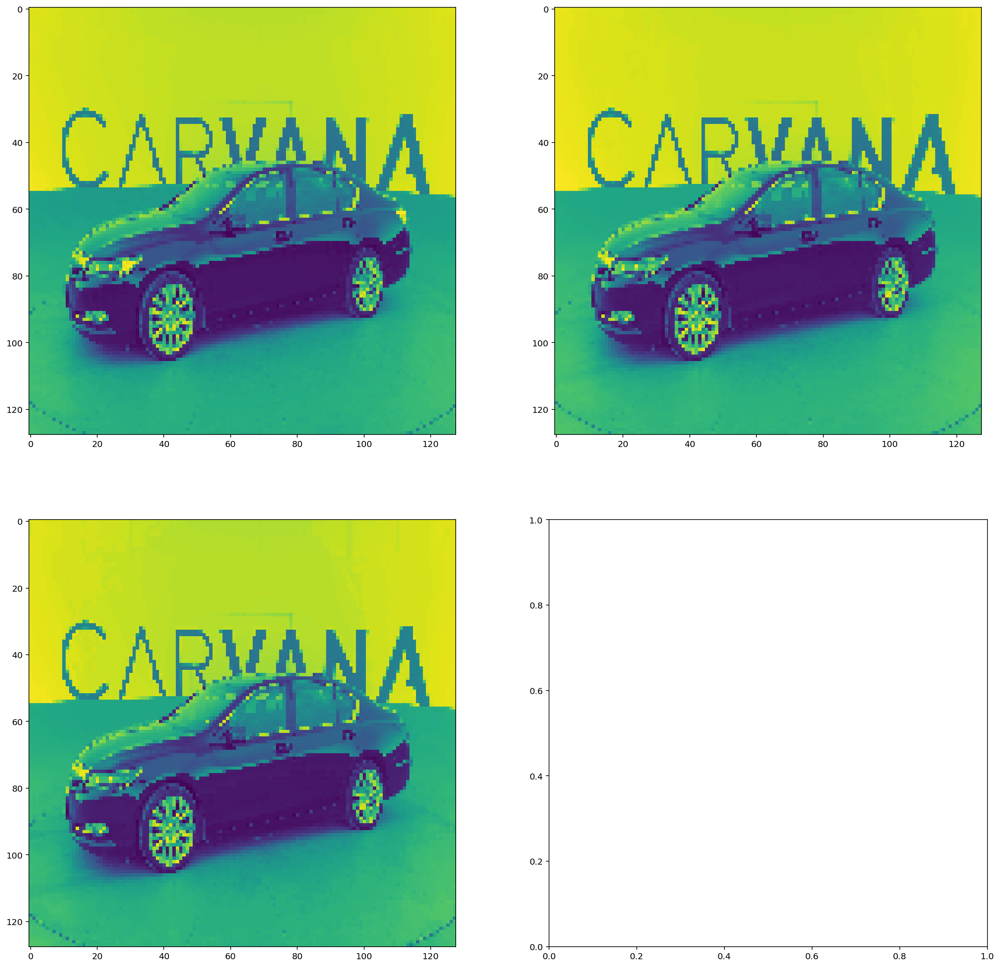

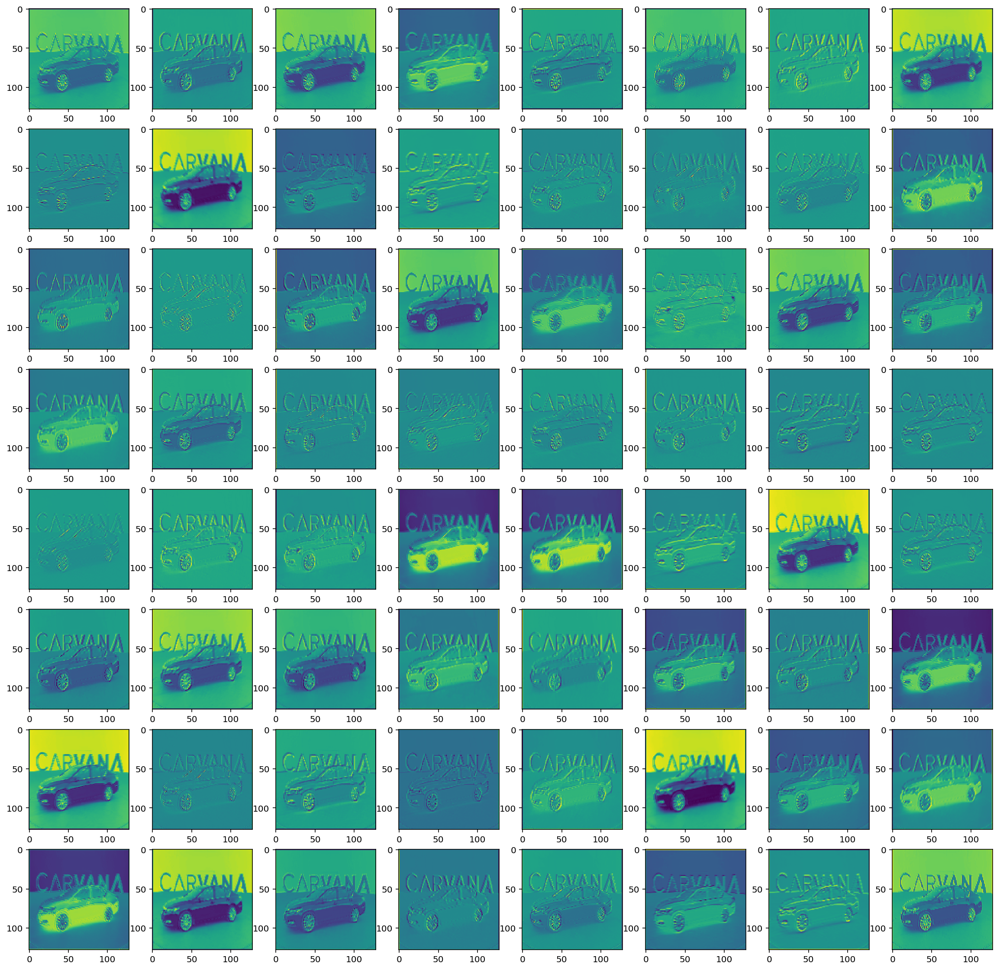

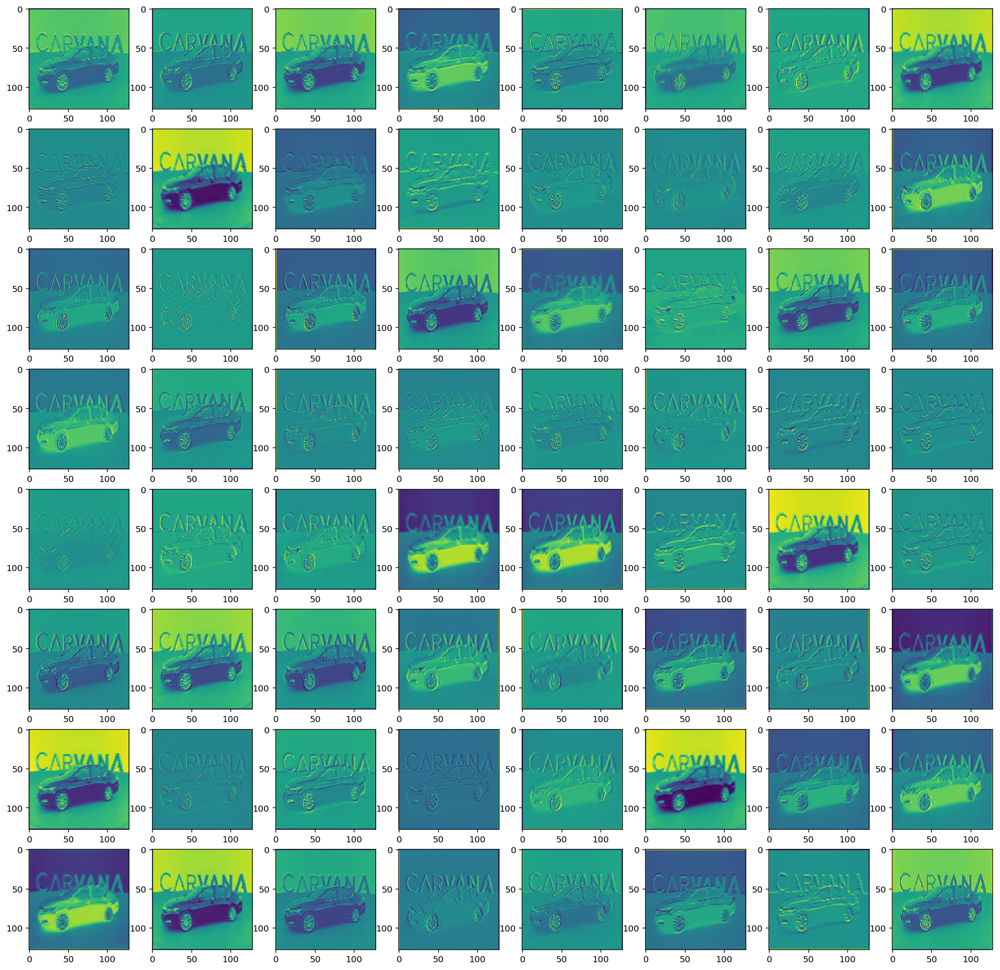

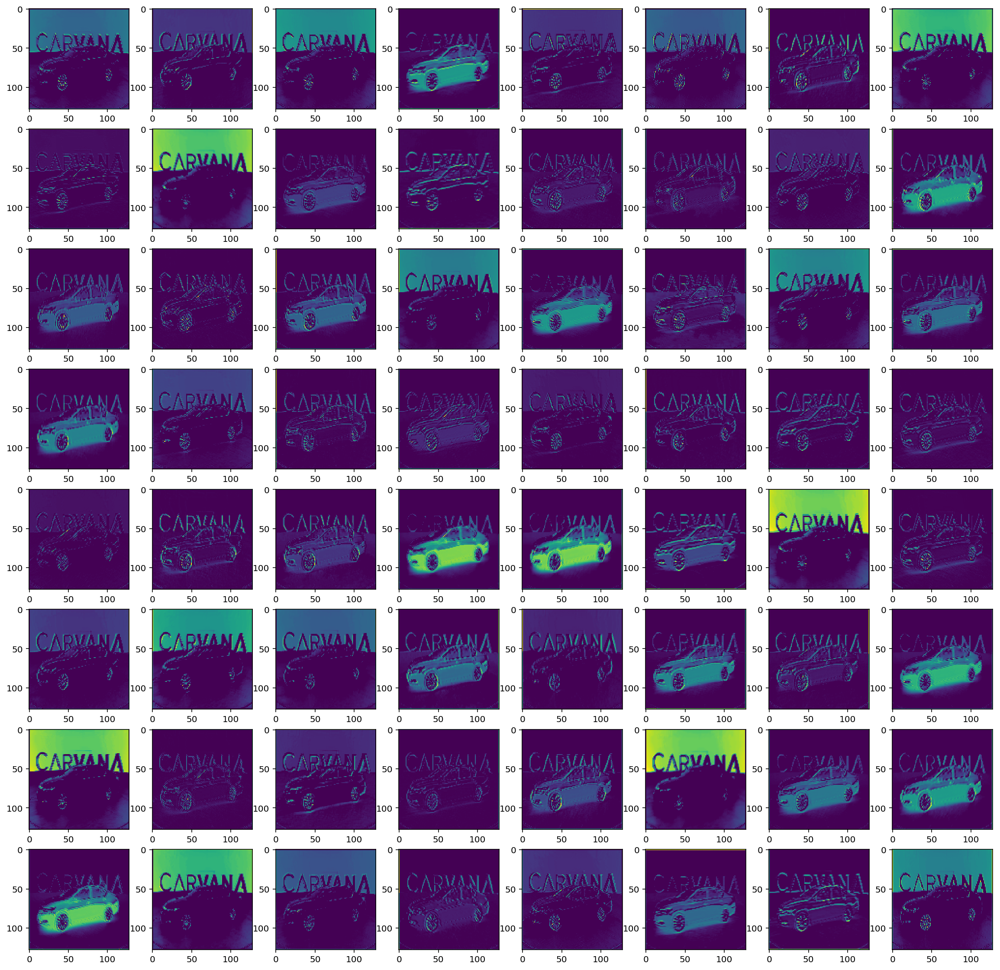

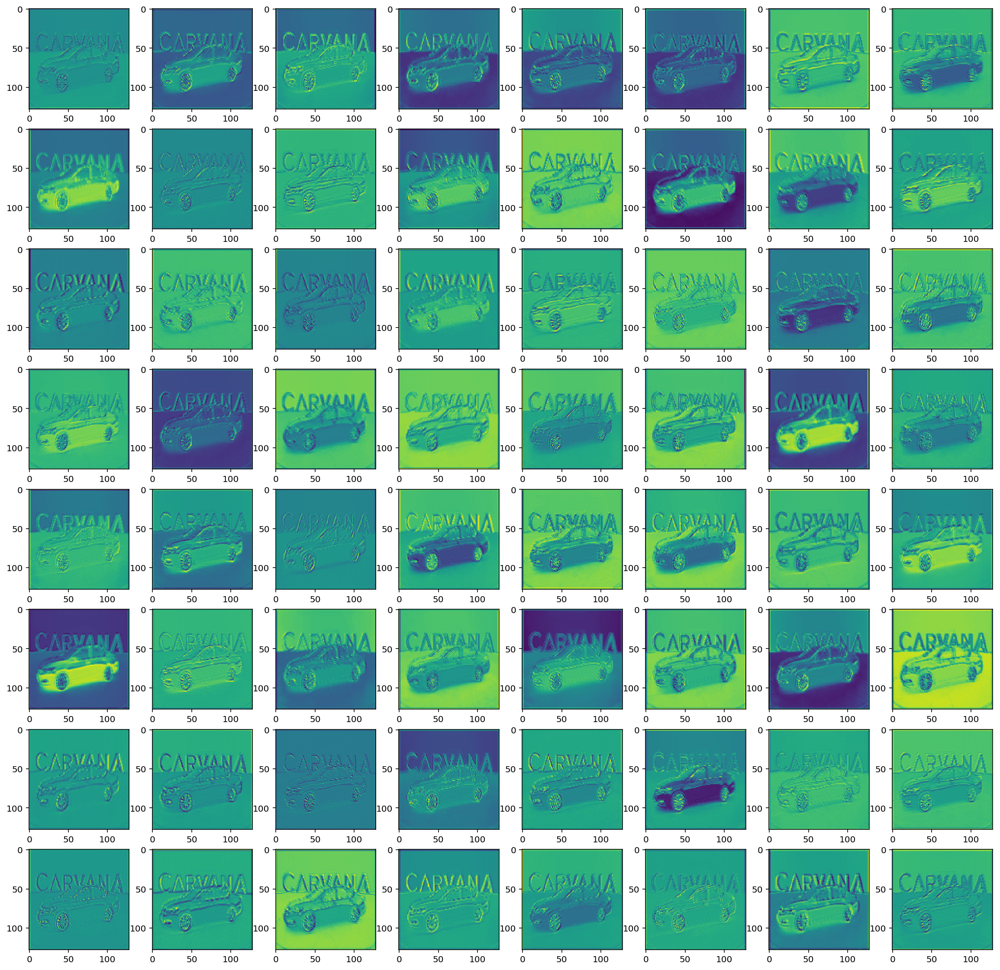

In [16]:
display_activations(act1)

----- activations -----
(1, 128, 128, 64)
Displaying activation map 0


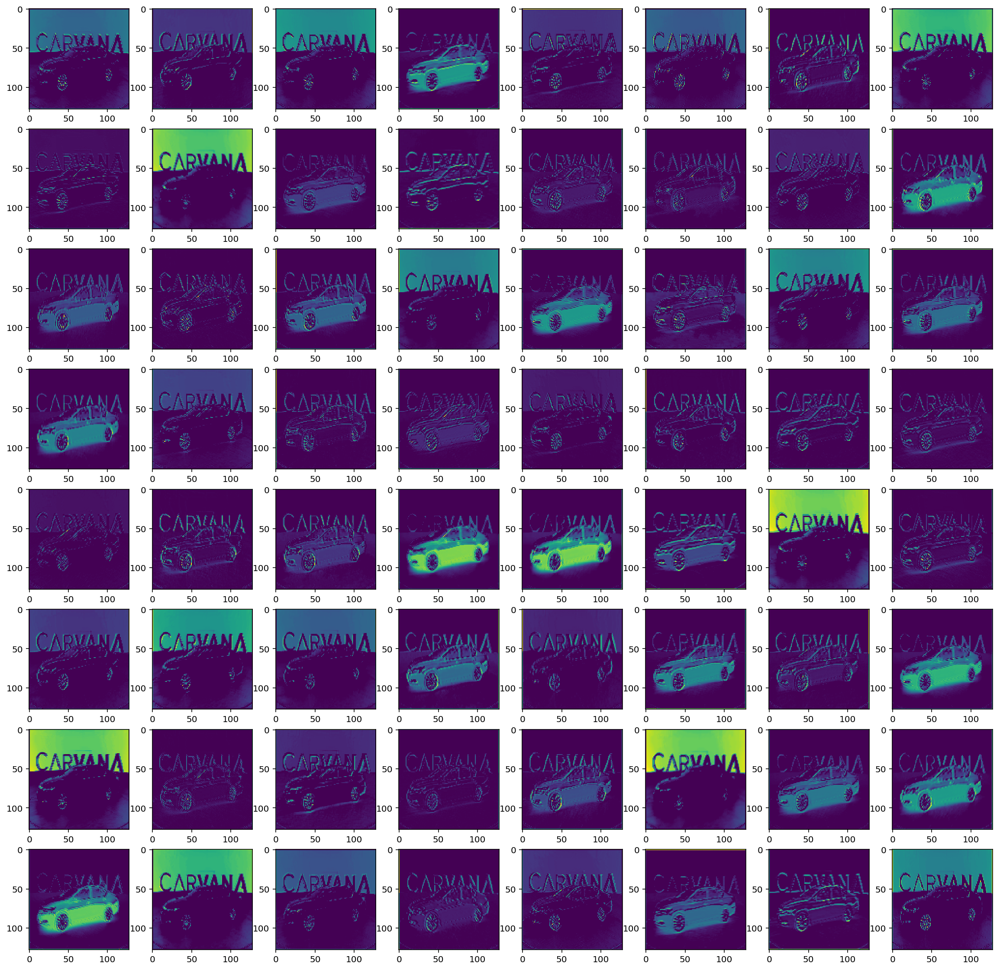

In [20]:
layer_name = 'activation_1'
activations = get_activations(unet_128, x_batch, print_shape_only=True, layer_name=layer_name)
display_activations(activations)

In [14]:
import utils.read_activations as rd_active
import imp
imp.reload(rd_active)


<module 'utils.read_activations' from 'D:\\tree\\UdacityMachineLearning\\MLNDCapstone\\utils\\read_activations.py'>

In [15]:
rd_active.save_activations(unet_128, x_batch)

----- activations -----
(1, 128, 128, 3)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 64, 64, 64)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 32, 32, 128)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 16, 16, 256)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 32, 32, 512)
(1, 32, 32, 768)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 32, 32, 256)
(1, 64, 64, 256)
(1, 64, 64, 384)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 128, 128, 128)
(1, 128, 128, 192)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 128, 64)
(1, 128, 12

In [16]:
import utils.vis as visutils
import imp
imp.reload(visutils)


<module 'utils.vis' from 'D:\\tree\\UdacityMachineLearning\\MLNDCapstone\\utils\\vis.py'>

In [17]:
visutils.vis_all_activations(unet_128)


Visualizing layer 0(input_1) activations
num_filters :  3
fig_size :  2
Visualizing layer 1(conv2d_1) activations
num_filters :  64
fig_size :  8
Visualizing layer 2(batch_normalization_1) activations
num_filters :  64
fig_size :  8
Visualizing layer 3(activation_1) activations
num_filters :  64
fig_size :  8
Visualizing layer 4(conv2d_2) activations
num_filters :  64
fig_size :  8
Visualizing layer 5(batch_normalization_2) activations
num_filters :  64
fig_size :  8
Visualizing layer 6(activation_2) activations
num_filters :  64
fig_size :  8
Visualizing layer 7(max_pooling2d_1) activations
num_filters :  64
fig_size :  8
Visualizing layer 8(conv2d_3) activations
num_filters :  128
fig_size :  12
Visualizing layer 9(batch_normalization_3) activations
num_filters :  128
fig_size :  12
Visualizing layer 10(activation_3) activations
num_filters :  128
fig_size :  12


KeyboardInterrupt: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.
